In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from collections import Counter
import pydicom
import cv2
import seaborn as sns
import torch
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision

import warnings
warnings.filterwarnings("ignore")

In [2]:
train_data = pd.read_csv('/kaggle/input/model-datatest-skincancer/train_data.csv')
train_data.head()

,image,diagnosis,age_approx,anatom_site_general,sex,path_jpg
0,ISIC_0072646,0,80.0,1,1,/kaggle/input/isic-2019-challenge/ISIC_2019_Tr...
1,ISIC_0033765,5,45.0,7,0,/kaggle/input/isic-2019-challenge/ISIC_2019_Tr...
2,ISIC_0025626,5,30.0,7,1,/kaggle/input/isic-2019-challenge/ISIC_2019_Tr...
3,ISIC_0012325_downsampled,5,40.0,7,1,/kaggle/input/isic-2019-challenge/ISIC_2019_Tr...
4,ISIC_0058703,1,75.0,1,1,/kaggle/input/isic-2019-challenge/ISIC_2019_Tr...


# original images

In [21]:
def show_images_jpg(data, n, rows, cols=5):
    plt.figure(figsize=(16, 6))

    for k, path in enumerate(data['path_jpg'][:n]):
        image = mpimg.imread(path)

        plt.subplot(rows, cols, k+1)
        plt.imshow(image)
        plt.axis('off')

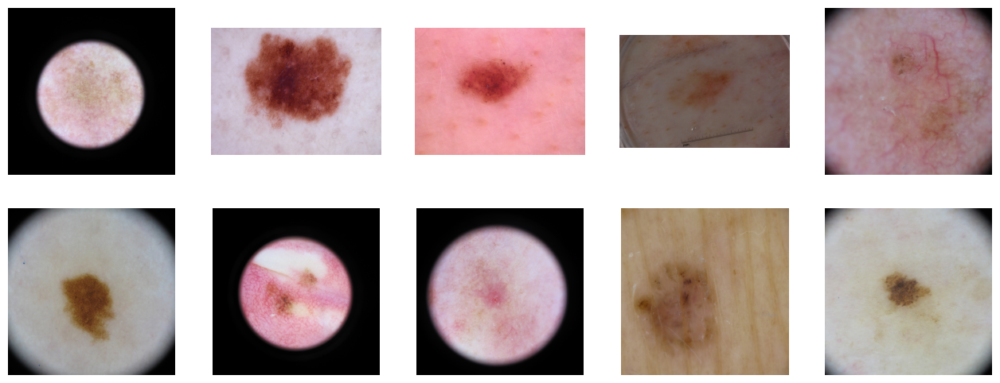

In [22]:
show_images_jpg(train_data, n=10, rows=2, cols=5)

# Transform 

In [23]:
class DatasetNew(Dataset):
    def __init__(self, image_list, transforms=None):
        self.image_list = image_list
        self.transforms = transforms
    
    def __len__(self):
        return (len(self.image_list))
    
    def __getitem__(self, i):
        image = plt.imread(self.image_list[i])
        image = Image.fromarray(image).convert('RGB')        
        image = np.asarray(image).astype(np.uint8)
        if self.transforms is not None:
            image = self.transforms(image)
            
        return torch.tensor(image, dtype=torch.float)

In [27]:
def show_transform(image, title="Default"):
    plt.figure(figsize=(16,6))
    plt.suptitle(title, fontsize = 16)
    
    image = image / 2 + 0.5  
    npimg = image.numpy()
    npimg = np.clip(npimg, 0., 1.)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

## Crop

In [28]:
def process_images_1(image_list, batch_size=12, show_title="Crop"):
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((300, 300)),
        transforms.CenterCrop((100, 100)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    pytorch_dataset = DatasetNew(image_list=image_list, transforms=transform)
    pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=batch_size, shuffle=True)

    images = next(iter(pytorch_dataloader))

    show_transform(torchvision.utils.make_grid(images, nrow=6), title=show_title)

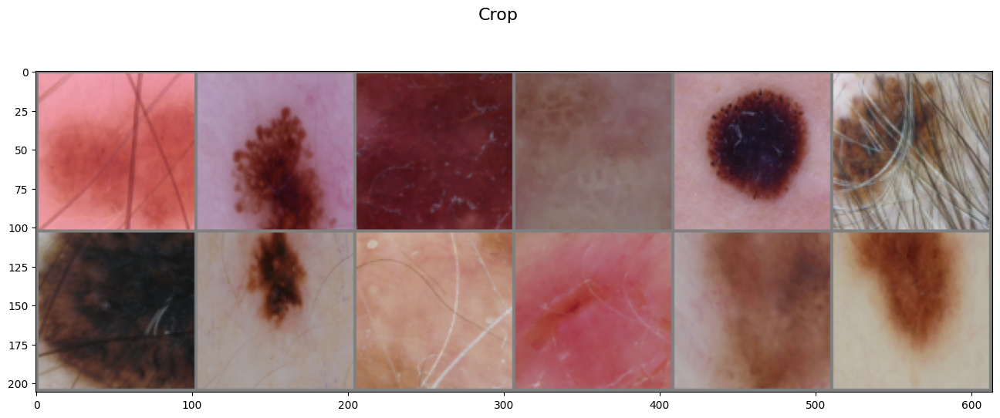

In [29]:
image_list = train_data.sample(12)['path_jpg']
image_list = image_list.reset_index()['path_jpg']

process_images_1(image_list, batch_size=12, show_title="Crop")

## Randomgreyscale

In [30]:
def process_images_3(image_list, batch_size=12, show_title="Crop"):
    
    transform = transforms.Compose([
         transforms.ToPILImage(),
         transforms.Resize((300, 300)),
         transforms.RandomGrayscale(p=0.7),
         transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

    pytorch_dataset = DatasetNew(image_list=image_list, transforms=transform)
    pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=batch_size, shuffle=True)

    images = next(iter(pytorch_dataloader))

    show_transform(torchvision.utils.make_grid(images, nrow=6), title=show_title)

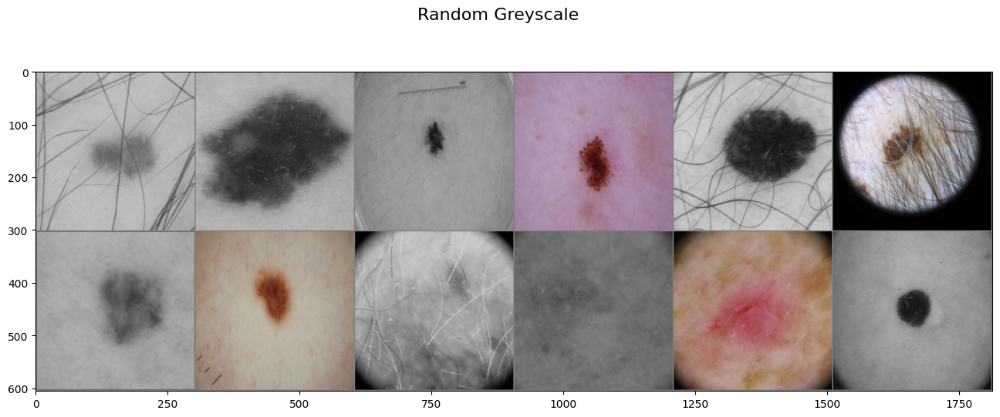

In [31]:
process_images_3(image_list, batch_size=12, show_title="Random Greyscale")

## RandomVerticalFlip

In [32]:
def process_images_4(image_list, batch_size=12, show_title="Crop"):
    
    transform = transforms.Compose([
         transforms.ToPILImage(),
         transforms.Resize((300, 300)),
         transforms.RandomVerticalFlip(p=0.7),
         transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])


    pytorch_dataset = DatasetNew(image_list=image_list, transforms=transform)
    pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=batch_size, shuffle=True)

    images = next(iter(pytorch_dataloader))

    show_transform(torchvision.utils.make_grid(images, nrow=6), title=show_title)

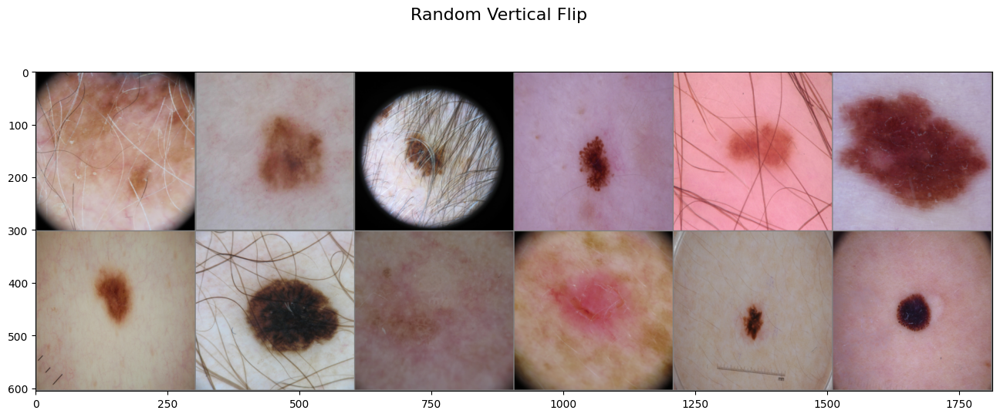

In [33]:
process_images_4(image_list, batch_size=12, show_title="Random Vertical Flip")

## Hair Remove

In [34]:
image_list1 = train_data['path_jpg'].sample(8).tolist()

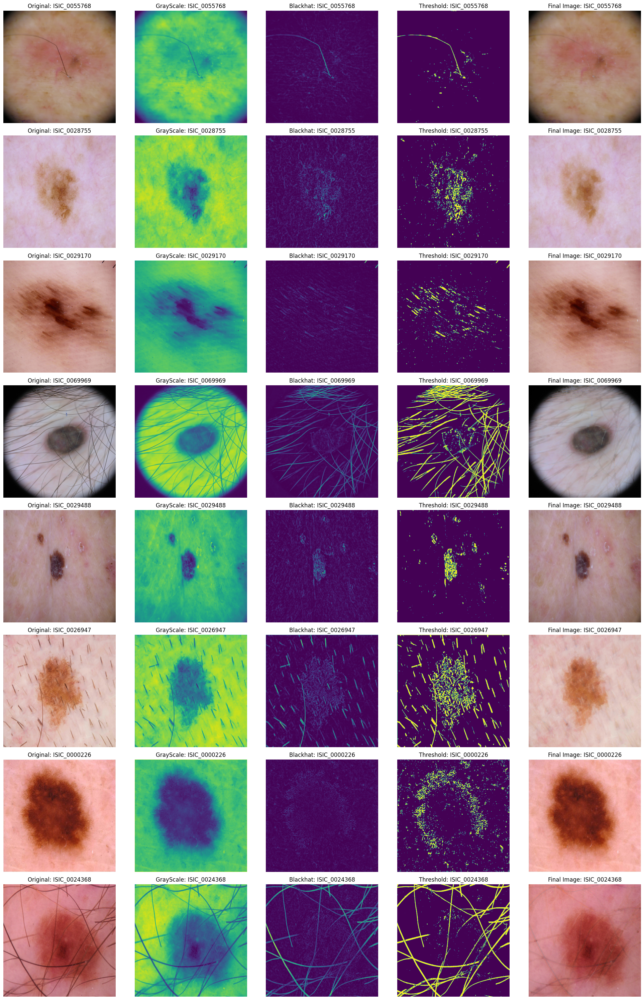

In [37]:
# Tạo subplot
l = len(image_list1)
fig = plt.figure(figsize=(20, 30))

# Lặp qua từng ảnh trong danh sách ảnh
for i, image_path in enumerate(image_list1):
    image_name = train_data.loc[train_data['path_jpg'] == image_path, 'image'].iloc[0]
    image = cv2.imread(image_path)
    image_resize = cv2.resize(image, (1024, 1024))
    
    # Hiển thị ảnh gốc
    plt.subplot(l, 5, (i * 5) + 1)
    plt.imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original: ' + image_name)
    
    # Chuyển đổi thành ảnh grayscale
    grayScale = cv2.cvtColor(image_resize, cv2.COLOR_RGB2GRAY)
    plt.subplot(l, 5, (i * 5) + 2)
    plt.imshow(grayScale)
    plt.axis('off')
    plt.title('GrayScale: ' + image_name)
    
    # Kernel cho việc lọc hình thái học
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (17, 17))
    
    # Thực hiện blackHat filtering để tìm contour của tóc
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    plt.subplot(l, 5, (i * 5) + 3)
    plt.imshow(blackhat)
    plt.axis('off')
    plt.title('Blackhat: ' + image_name)
    
    # Tăng cường contour của tóc để chuẩn bị cho việc inpainting
    ret, threshold = cv2.threshold(blackhat, 10, 255, cv2.THRESH_BINARY)
    plt.subplot(l, 5, (i * 5) + 4)
    plt.imshow(threshold)
    plt.axis('off')
    plt.title('Threshold: ' + image_name)
    
    # Inpainting ảnh gốc dựa trên mặt nạ đã tạo
    final_image = cv2.inpaint(image_resize, threshold, 1, cv2.INPAINT_TELEA)
    plt.subplot(l, 5, (i * 5) + 5)
    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Final Image: ' + image_name)

plt.tight_layout()
plt.show()

In [38]:
def remove_hair(image):
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    kernel = cv2.getStructuringElement(1,(17,17))
    
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)
    
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)
    
    return final_image

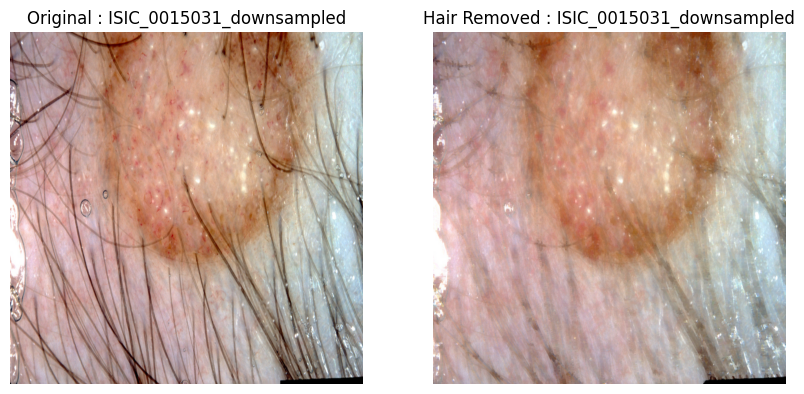

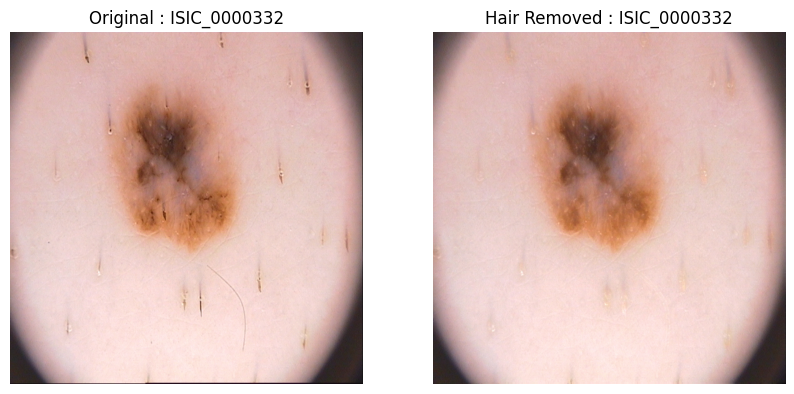

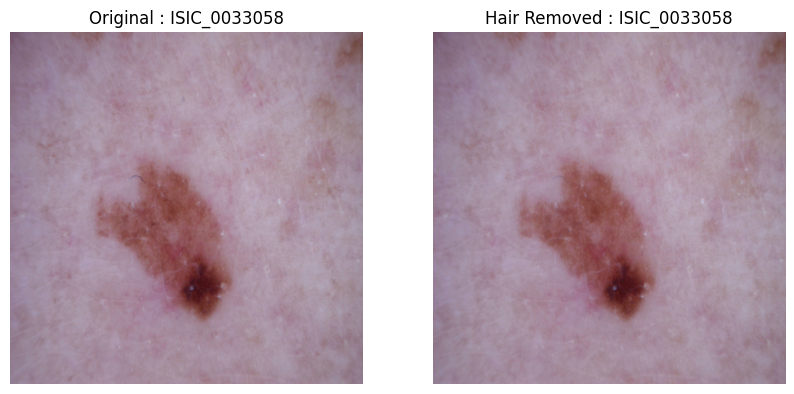

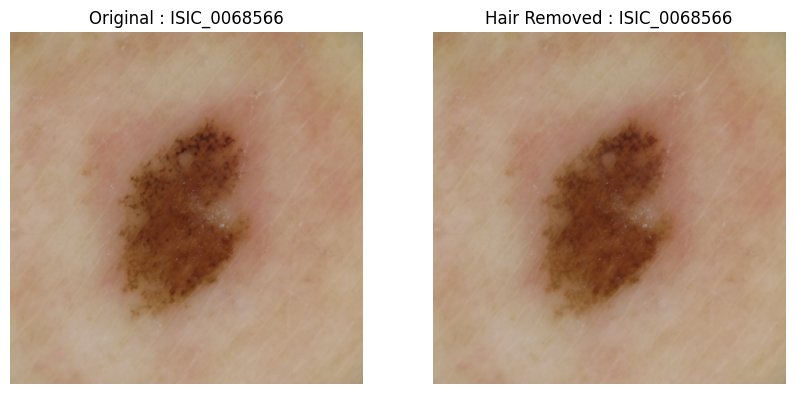

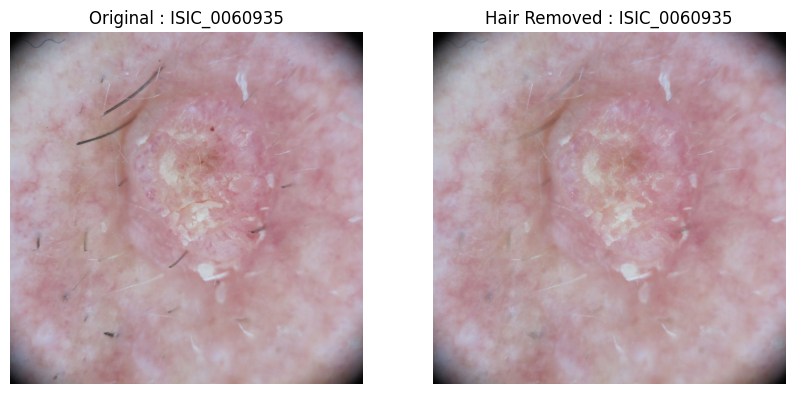

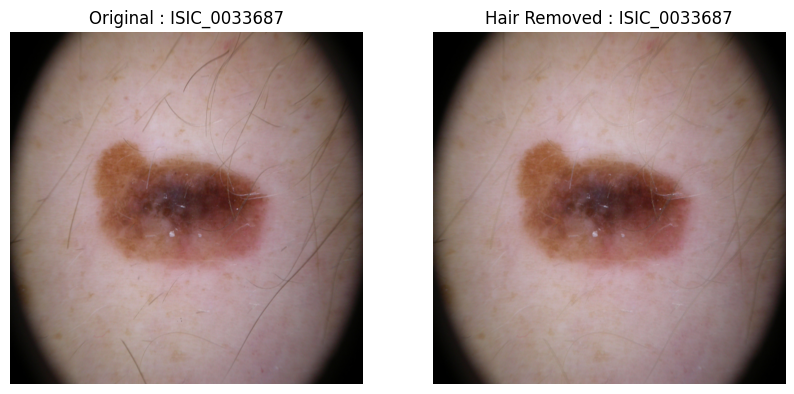

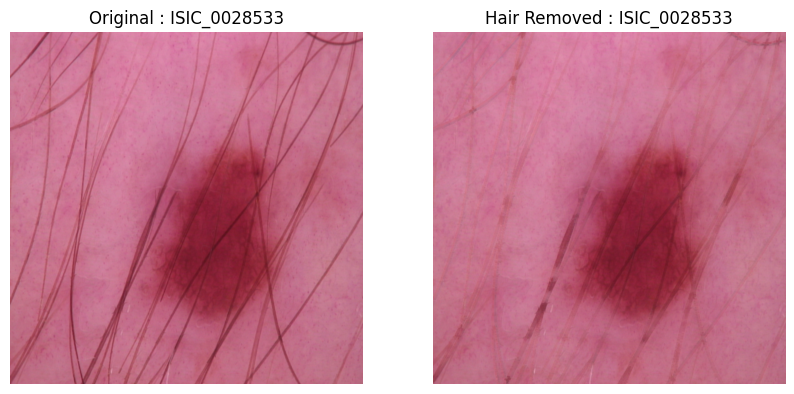

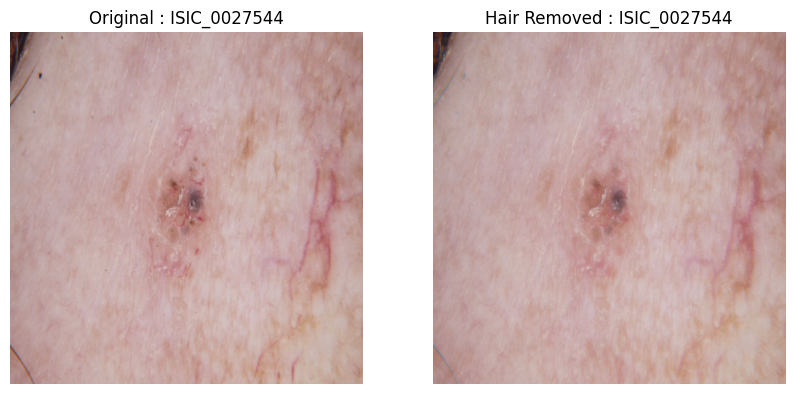

In [41]:
image_list1 = train_data['path_jpg'].sample(8).tolist()
for i, image_path in enumerate(image_list1):
    
    fig = plt.figure(figsize=(10,5))
    
    image_name = train_data.loc[train_data['path_jpg'] == image_path, 'image'].iloc[0]
    image = cv2.imread(image_path)
    image_resize = cv2.resize(image, (1024, 1024))
    image_resize = cv2.resize(image, (1024, 1024))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original : '+ image_name)
    
    final_image = remove_hair(image_resize)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Hair Removed : '+ image_name)
    
plt.show()